## Import all the Lib. and Packages

In [1]:
from collections import defaultdict
import os
import glob
import random
import sys
import time
import matplotlib.pyplot as plt
import keras
import numpy as np
import cv2
from sklearn.metrics import confusion_matrix
import itertools
from keras.preprocessing import image
from sklearn.metrics import accuracy_score
from keras.callbacks import ModelCheckpoint
from keras.models import model_from_yaml
from keras.layers import Input, Average
from keras.layers.core import Dense, Flatten, Dropout
from keras.layers.merge import Concatenate
from keras.layers.normalization import BatchNormalization
from keras.layers.pooling import GlobalAveragePooling2D, GlobalMaxPooling2D
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import Model
from collections import Counter
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn.metrics import roc_curve, auc
from scipy import interp
from sklearn.metrics import classification_report
import sklearn
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.utils.fixes import signature
from keras.utils import to_categorical

C:\Users\kamru\Anaconda3\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


## Create the model with the VGG16

In [2]:
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = vgg16.get_layer('block5_conv3').output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(5, activation='softmax')(x)

modelFinal = Model(inputs=vgg16.input, outputs=x)

In [3]:
# for layer in vgg16.layers:
#     layer.trainable = False

for layer in modelFinal.layers[:11]:
    layer.trainable = False
for layer in modelFinal.layers[11:]:
    layer.trainable = True	

modelFinal.summary()

modelFinal.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])



for i, layer in enumerate(modelFinal.layers):
    print(i, layer.name)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [4]:
PATH = os.getcwd()
train_data_dir =PATH+ '/data/Train/'
validation_data_dir = PATH+'/data/Test/'

In [5]:
img_width = 224  # Change image size for training here
img_height = 224 # Change image size for training here

batch_size = 10 # i achieved good and fast results with this small minibatch size for training
batch_size_val = 10 # if Tensorflow throws a memory error while validating at end of epoch, decrease validation batch size her

# set data augmentation parameters here
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=.1,
    height_shift_range=.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=False,
    fill_mode="nearest")

# normalization neccessary for correct image input to VGG16
#datagen.mean=np.array([103.939, 116.779, 123.68],dtype=np.float32).reshape(1,1,3)

# no data augmentation for validation and test set
validgen = ImageDataGenerator(preprocessing_function=preprocess_input)

#validgen.mean=np.array([103.939, 116.779, 123.68],dtype=np.float32).reshape(1,1,3)

train_gen = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode="categorical",
        shuffle=True, 
        #save_to_dir="_augmented_images/", 
        #save_prefix="aug_"
        )

val_gen = validgen.flow_from_directory(
        validation_data_dir,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode="categorical",
        shuffle=True)

Found 1724 images belonging to 5 classes.
Found 280 images belonging to 5 classes.


In [6]:
def get_class_weights(y):
    counter = Counter(y)
    majority = max(counter.values())
    return  {cls: round(float(majority)/float(count), 2) for cls, count in counter.items()}

class_weights = get_class_weights(train_gen.classes)
print(class_weights)
print(train_gen.class_indices)
print(val_gen.class_indices)
class_weights = get_class_weights(val_gen.classes)
print(class_weights)


{0: 1.0, 1: 1.73, 2: 1.47, 3: 14.53, 4: 5.1}
{'Type01': 0, 'Type02': 1, 'Type03': 2, 'Type04': 3, 'Type05': 4}
{'Type01': 0, 'Type02': 1, 'Type03': 2, 'Type04': 3, 'Type05': 4}
{0: 1.0, 1: 1.72, 2: 1.47, 3: 14.0, 4: 5.89}


In [7]:
epochs=2

# I stopped training automagically with EarlyStopping after 3 consecutive epochs without improvement
# early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, mode='auto')

train_samples = len(train_gen.filenames)
validation_samples = len(val_gen.filenames)

In [8]:
Intermediate_model='InterMediateCroppedVGG16_V1_'
Intermediate_SaveweightName= Intermediate_model+'.hdf5'
Intermediate_SaveModelName=Intermediate_model+'.yaml'

checkpoint_Intermediate = ModelCheckpoint(Intermediate_SaveweightName, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

model_yaml = modelFinal.to_yaml()
with open(Intermediate_SaveModelName, "w") as yaml_file:
    yaml_file.write(model_yaml)

history=modelFinal.fit_generator(train_gen, epochs=epochs, 
                          steps_per_epoch=200, 
                          validation_data=val_gen, 
                          validation_steps=30, 
                          class_weight=class_weights,
                          verbose=1, 
                          callbacks=[checkpoint_Intermediate])

Epoch 1/2
200/200 [==============================] - 38s 192ms/step - loss: 3.7941 - acc: 0.2122 - val_loss: 3.1993 - val_acc: 0.2367

Epoch 00001: val_acc improved from -inf to 0.23667, saving model to InterMediateCroppedVGG16_V1_.hdf5
Epoch 2/2
200/200 [==============================] - 32s 160ms/step - loss: 3.4655 - acc: 0.2407 - val_loss: 1.5758 - val_acc: 0.2433

Epoch 00002: val_acc improved from 0.23667 to 0.24333, saving model to InterMediateCroppedVGG16_V1_.hdf5


C:\Users\kamru\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


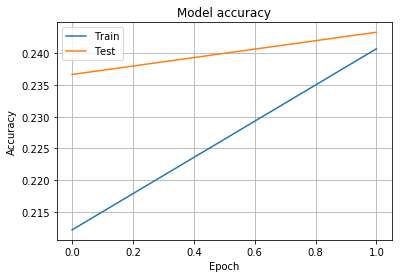

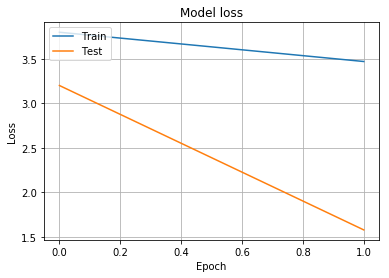

In [9]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid('on')

plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.grid('on')
plt.show()

In [10]:
def Performance_helper(true_class,pred):
    #............................................................Description of this Helper Function.................................................................................
    
    # This function will take True calss label from the Image Test Generator and Predicted Label from the CNN classifier.
    
    # Objectives of the Function are given below--
    
    # 1. This will plot ROC curve with the AUC values
    # 2. Normalized Confusion Matrix
    # 3. Classification Report for the Classifier 
    # 4. Average Precision Score 
    # 5. Precision VS Recal Curve 
    
    #..............................................................................................................................................................................................
    
    #---------------------------------------ROC and AUC----------------------------------------------
    num_classes=5  # Number of Class which is number of output Neuron. In this example it is 3 which are {'bkl': 1, 'mel': 2, 'bcc': 0}.
    true_classes=keras.utils.to_categorical(true_class, num_classes=num_classes)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_classes[:, i], pred[:, i]) # Getting TPR and FPR for different threshold using sklearn Function roc_curve. 
        roc_auc[i] = auc(fpr[i], tpr[i])        # Sklean function auc will return Area Under the ROC curve value using previous TPR and FPR.
    
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        
    # Finally average it and compute AUC.
    mean_tpr /= num_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
    # Define the figures and plot the ROC curve. To plot the ROC curve matplotlib has been used. 
    plt.figure()
    plt.plot(fpr["macro"], tpr["macro"], label='Macro-avg ROC with AUC = {0:0.2f}'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle='-', linewidth=2)
    plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier with AUC = 0.5 ',lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.grid('on')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Macro Average ROC curve')
    plt.legend(loc="lower right")
    plt.show()
    
    #--------------------------------------ConfusionMatrix----------------------------------------
    predicted_classes = np.argmax(pred,axis=1) # Assing the class label either Lesion or Nevus [{'bkl': 1, 'mel': 2, 'bcc': 0}]
    classes=['Type01','Type02','Type03','Type04','Type05']
    title='Normalized Confusion Matrix'
    cmap=plt.cm.Blues
    cm = confusion_matrix(true_class, predicted_classes)
    
#     cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # Normalizing the TP, FP, FN and TN in Confusion Matrix
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' 
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    
    
    #--------------------------------------------Precision VS Recal Analysis---------------------------------------------------
    # For each class
    precision = dict()
    recall = dict()
    average_precision = dict()      
    x = np.float32(true_classes)
    for i in range(num_classes):
        precision[i], recall[i], _ = precision_recall_curve(true_classes[:, i], pred[:, i])
        average_precision[i] = average_precision_score(x[:, i], pred[:, i])

    step_kwargs = ({'step': 'post'}
               if 'step' in signature(plt.fill_between).parameters
               else {})
    # A "micro-average": quantifying score on all classes jointly
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_classes.ravel(), pred.ravel())
    average_precision["micro"] = average_precision_score(true_classes, pred, average="micro")
#     print('Average precision score (micro-averaged over all classes): {0:0.2f}'.format(average_precision["micro"]))
    target_names=['class: Type01', 'class: Type02', 'class: Type03', 'class: Type04', 'class: Type05']
    ClassificationReport=classification_report(true_class, predicted_classes, target_names=target_names)
    print(ClassificationReport)
    
    plt.figure()
    plt.step(recall['micro'], precision['micro'], color='b', alpha=0.2,where='post')
    plt.fill_between(recall["micro"], precision["micro"], alpha=0.2, color='b',**step_kwargs)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision VS Recall Curve')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('Average precision score, micro-averaged over all classes: AP={0:0.2f}'.format(average_precision["micro"]))
    

In [11]:
def WrongClassifiedImages(Test_generator, pred_vgg16, ImageDir):
    #............................................................Description of this Helper Function.................................................................................
    
    # This function will take the Image Test Generator, Predicted Label from the CNN classifier and  test Image Directory.
    
    # Objectives of the Function are given below--
    
    # 1. This will print total number of mis-classified Images 
    # 2. It will show all the the mis-classified Images with confidence label
    
    #..............................................................................................................................................................................................
    
    # Get the filenames from the generator
    fnames = Test_generator.filenames

    predicted_classes_VGG16=np.argmax(pred_vgg16,axis=1)

    # Get the label to class mapping from the generator
    label2index = Test_generator.class_indices

    # Getting the mapping from class index to class label
    idx2label = dict((v,k) for k,v in label2index.items())

    errors = np.where(predicted_classes_VGG16 != Test_generator.classes)[0]
    print("No of errors = {}/{}".format(len(errors),Test_generator.samples))


    # Show the errors Images. Here, I am showing all ( len(errors)) the Mis-classified Image. If you want some first specific Numbers, Please, change the Numbers.
    NumberImages=len(errors)
    for i in range(NumberImages):
        pred_class = np.argmax(pred_vgg16[errors[i]])
        # print pred_class.dtype
        pred_label = idx2label[pred_class]
        title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(fnames[errors[i]].split('/')[0], pred_label, pred_vgg16[errors[i]][pred_class])
        original = image.load_img('{}/{}'.format(ImageDir,fnames[errors[i]]))
        plt.figure(figsize=[3,3])
        plt.axis('off')
        plt.title(title)
        plt.imshow(original)
        plt.show()

In [12]:
# Loading the Image Path 

# Test_gen = validgen.flow_from_directory(
#         validation_data_dir,
#         target_size=(img_height, img_width),
#         batch_size=batch_size,
#         class_mode="categorical",
#         shuffle=False)


ImageDir = validation_data_dir
batch_size=1
Test_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
Test_gen = Test_gen.flow_from_directory(
        ImageDir,
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode="categorical",
        shuffle=False)
print(Test_gen.class_indices)
print(Test_gen.classes)
print(to_categorical(Test_gen.classes, num_classes=None, dtype='float32'))

Found 280 images belonging to 5 classes.
{'Type01': 0, 'Type02': 1, 'Type03': 2, 'Type04': 3, 'Type05': 4}
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3
 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]
[[1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]]


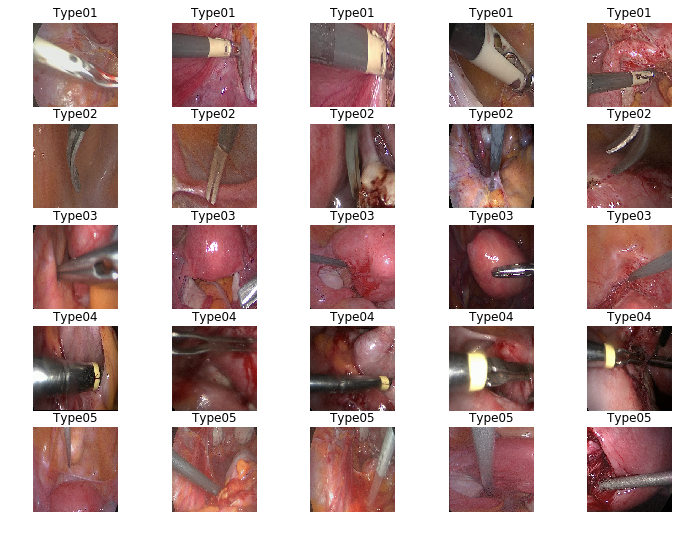

In [18]:
n=5

Type01=glob.glob(ImageDir+'Type01/*.png')
Type02=glob.glob(ImageDir+'Type02/*.png')
Type03=glob.glob(ImageDir+'Type03/*.png')
Type04=glob.glob(ImageDir+'Type04/*.png')
Type05=glob.glob(ImageDir+'Type05/*.png')


Type011= np.random.choice(Type01, n)
Type022= np.random.choice(Type02, n)
Type033= np.random.choice(Type03, n)
Type044= np.random.choice(Type04, n)
Type055 = np.random.choice(Type05, n)

data = np.concatenate((Type011, Type022, Type033, Type044, Type055))
data.shape
labels = n * ['Type01'] + n *['Type02']+ n*['Type03'] + n*['Type04'] + n*['Type05']

N, R, C = n*n,n,n
plt.figure(figsize=(12, 9))
for k, (src, label) in enumerate(zip(data, labels)):
    im=cv2.imread(src,-1)
    im=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    plt.subplot(R, C, k+1)
    plt.title(label)
    plt.imshow(np.asarray(im))
    plt.axis('off')

In [14]:
modelPredict = modelFinal.predict_generator(Test_gen,
                                                 steps=280,
                                                 verbose=1)

280/280 [==============================] - 4s 16ms/step


In [15]:
predicted_classes = np.argmax(modelPredict,axis=1)
predicted_classes

array([3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 2, 3, 1, 1, 3, 3,
       3, 3, 3, 3, 2, 3, 1, 2, 3, 1, 1, 1, 2, 3, 1, 3, 3, 3, 3, 3, 1, 3,
       1, 3, 3, 2, 3, 3, 1, 3, 3, 2, 3, 3, 1, 1, 3, 3, 3, 3, 3, 3, 3, 2,
       1, 3, 2, 3, 1, 1, 1, 1, 1, 2, 3, 3, 1, 1, 2, 3, 3, 3, 2, 1, 1, 3,
       3, 3, 1, 1, 3, 3, 3, 3, 1, 2, 3, 3, 3, 1, 3, 3, 3, 3, 2, 3, 3, 1,
       3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3,
       1, 3, 1, 1, 2, 2, 3, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 3, 3, 1, 3, 1,
       1, 1, 1, 1, 1, 2, 3, 3, 3, 2, 2, 3, 1, 1, 3, 3, 3, 1, 1, 3, 3, 2,
       3, 2, 1, 1, 1, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 3, 1, 3, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 3, 1, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1], dtype=int64)

Accuracy on Test Data is 0.242857


C:\Users\kamru\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


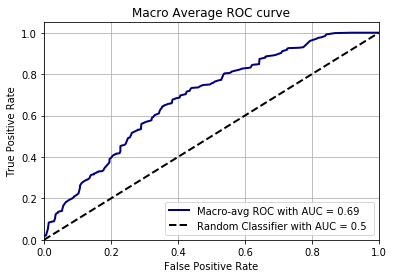

               precision    recall  f1-score   support

class: Type01       0.00      0.00      0.00       112
class: Type02       0.38      0.88      0.53        65
class: Type03       0.24      0.08      0.12        76
class: Type04       0.05      0.62      0.09         8
class: Type05       0.00      0.00      0.00        19

    micro avg       0.24      0.24      0.24       280
    macro avg       0.13      0.32      0.15       280
 weighted avg       0.16      0.24      0.16       280



C:\Users\kamru\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


No of errors = 212/280


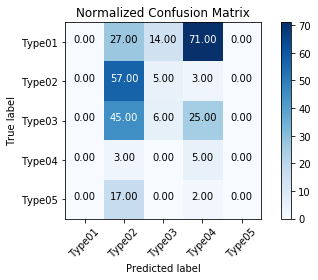

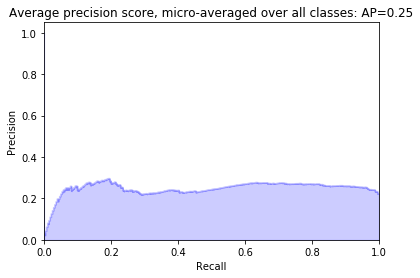

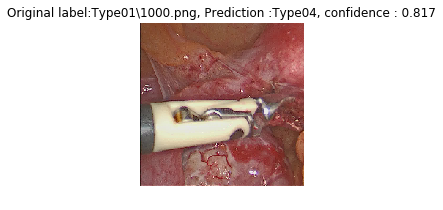

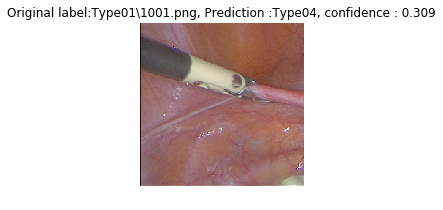

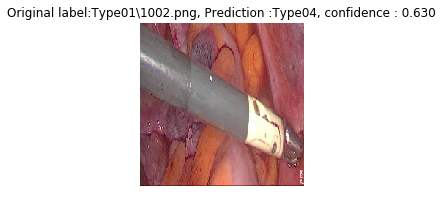

...

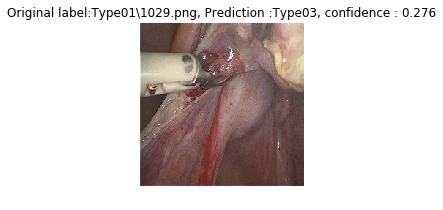

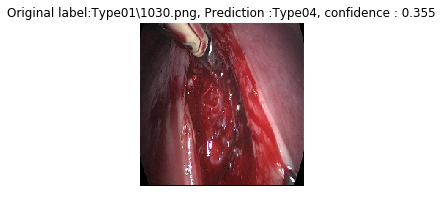

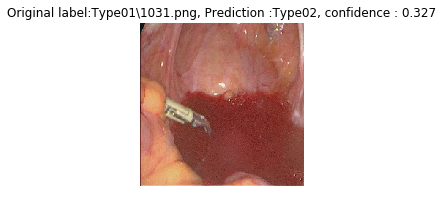

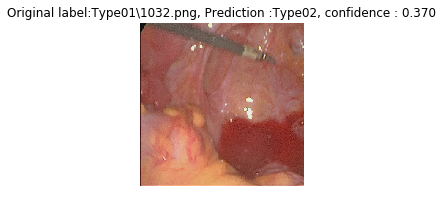

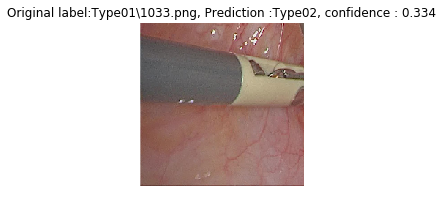

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


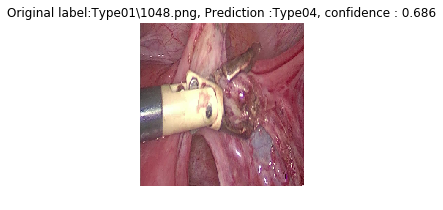

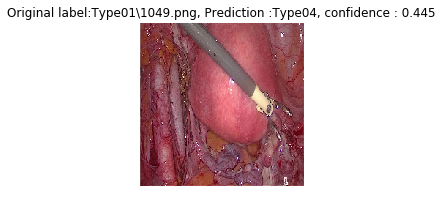

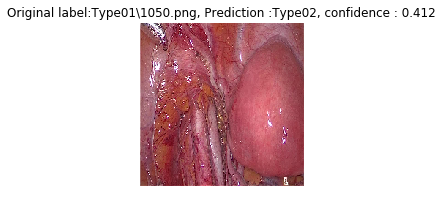

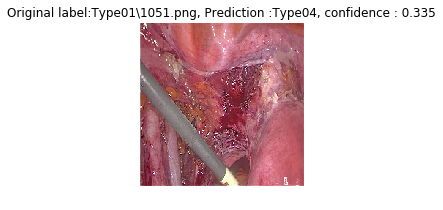

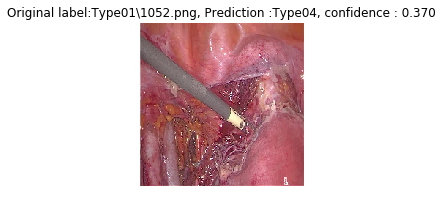

...

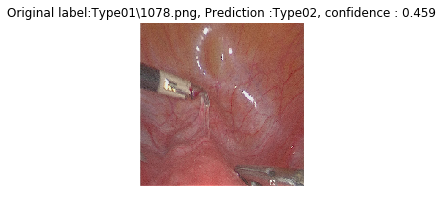

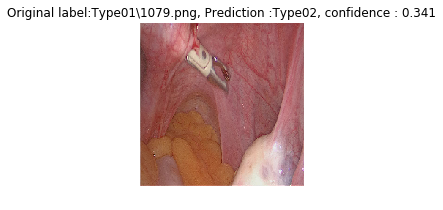

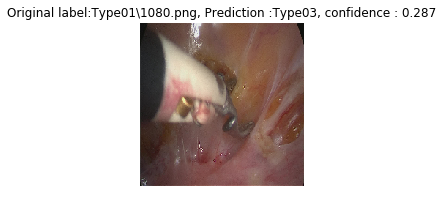

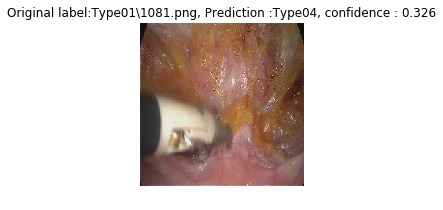

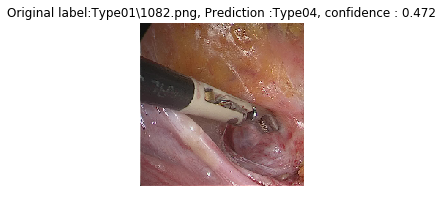

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


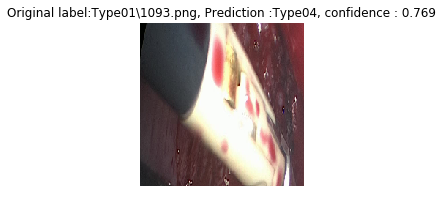

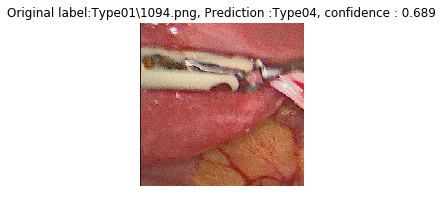

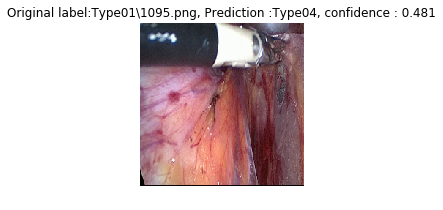

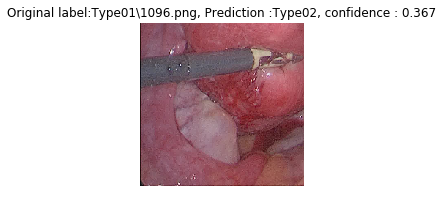

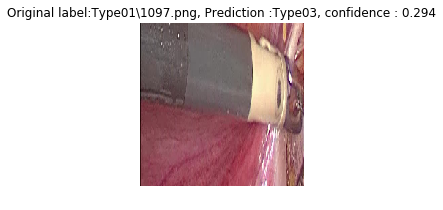

...

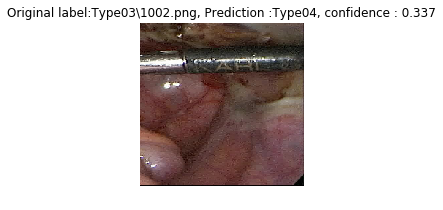

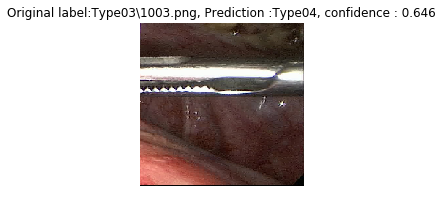

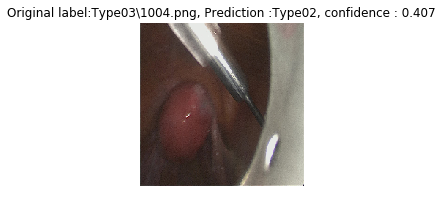

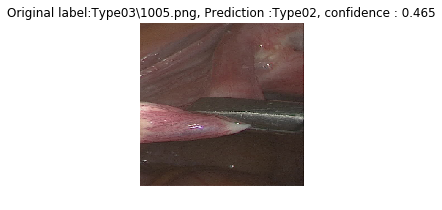

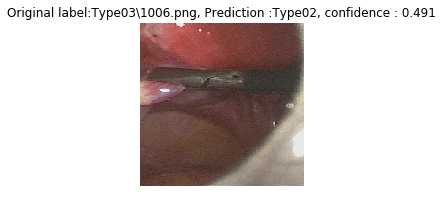

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


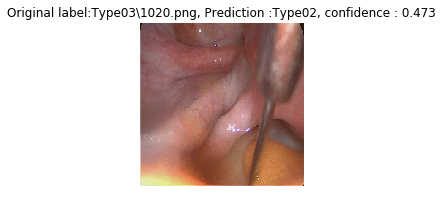

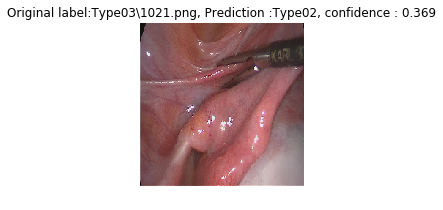

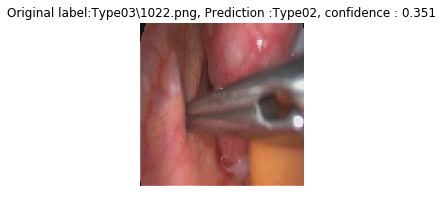

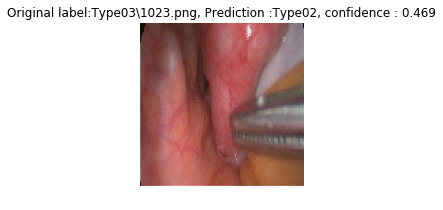

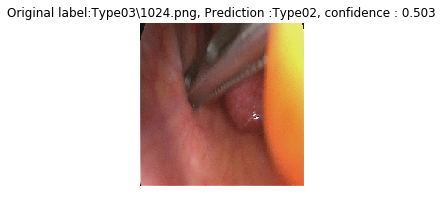

...

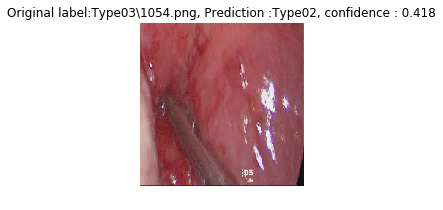

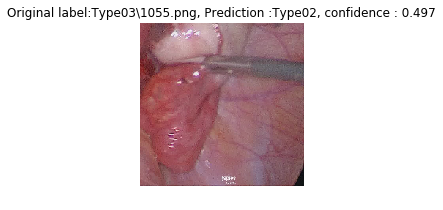

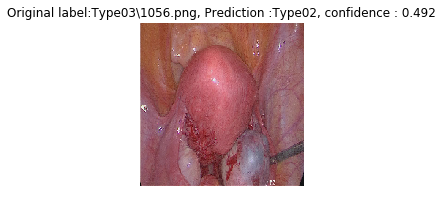

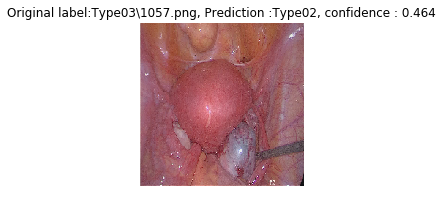

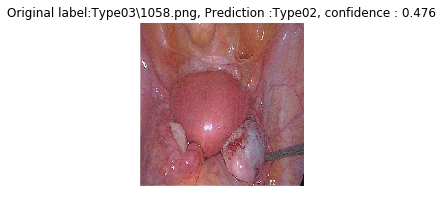

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


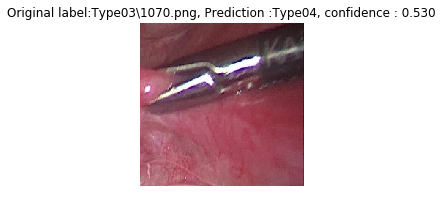

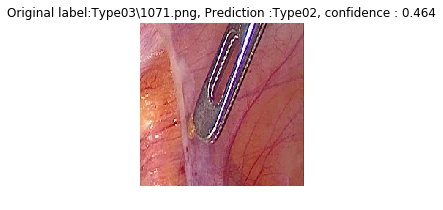

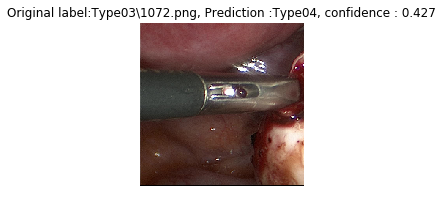

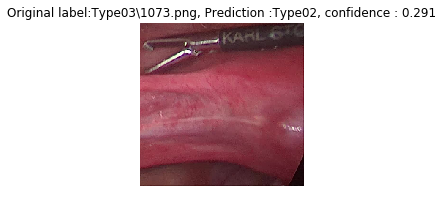

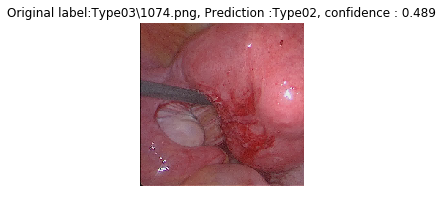

...

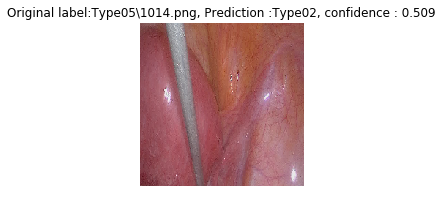

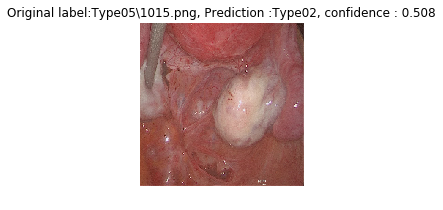

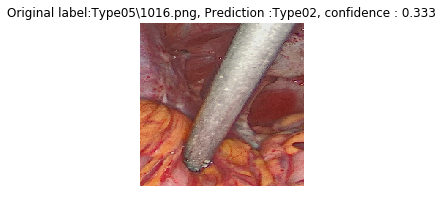

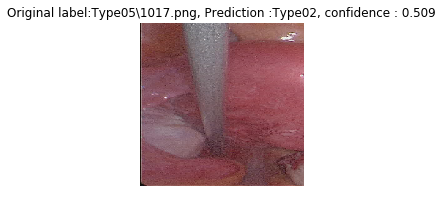

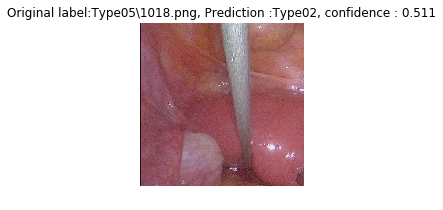

In [16]:
predicted_classes_VGG16_V1 = np.argmax(modelPredict,axis=1) # Assing the class label either Lesion or Nevus [{'bkl': 1, 'mel': 2, 'bcc': 0}]

True_class_V1=Test_gen.classes

# print predicted_classes_VGG16
# print true_classes_VGG16

VGG16Accuracy_V1=accuracy_score(True_class_V1, predicted_classes_VGG16_V1)

print('Accuracy on Test Data is {:f}'.format(VGG16Accuracy_V1))

Performance_helper(True_class_V1, modelPredict)  

WrongClassifiedImages(Test_gen, modelPredict, ImageDir)